In [23]:
import os
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from IPython.display import Audio
import torch
import soundfile as sf

from mir_eval import separation
from model.network import UNet, encoder, decoder
from preprocessing.data import dataloader

Load audio

In [3]:
song_path = "data/DSD100subset/Mixtures/Dev/081 - Patrick Talbot - Set Me Free/mixture.wav"
audio_array, sr = librosa.load(song_path)

In [4]:
Audio(audio_array, rate=sr)


Spectrogram

In [5]:
audio_stft = librosa.stft(audio_array, n_fft=1024, hop_length=768)

In [6]:
audio_stft.shape

(513, 1208)

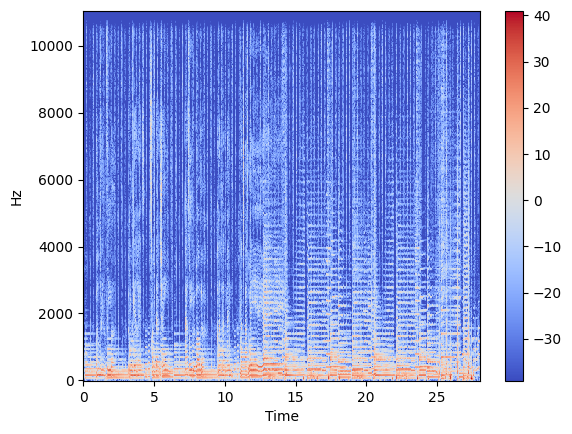

In [7]:
audio_stft_db = librosa.amplitude_to_db(np.abs(audio_stft))
librosa.display.specshow(audio_stft_db, sr=sr, x_axis="time", y_axis="hz")
plt.colorbar()
plt.show()

invers_stft

In [8]:
audio_inv_stft = librosa.istft(
    (
        audio_stft[
            :511,
        ]
    ),
    n_fft=1024,
    hop_length=768,
)

In [9]:
Audio(audio_inv_stft, rate=sr)

Load model

In [10]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")


In [11]:
stem = "vocal"
# stem = 'instrumental'
# stem = 'bass'
# stem = 'drum'


In [12]:
model = torch.load(f"./model/{stem}_best_model.pt", map_location=device)


In [13]:
total_frame = audio_stft.shape[1] // 127 + 1
done_frame = 0
model.eval()
for i in range(0, audio_stft.shape[1], 127):
    mixture = np.abs(audio_stft[:511, i : i + 127])
    col_num = mixture.shape[1]
    if col_num != 127:
        mixture = np.concatenate(
            (mixture, np.zeros(shape=(511, 127 - col_num))), axis=1
        )

    mixture = torch.from_numpy(mixture[np.newaxis, np.newaxis, :, :]).to(device)
    input = dataloader(mixture.to(torch.float32), batch_size=1)
    with torch.no_grad():
        for x in input:
            # print(x.shape)
            y = model(x)
            if i == 0:
                output = y[0][0]
            else:
                if col_num == 127:
                    output = torch.cat([output, y[0][0]], dim=1)
                else:
                    output = torch.cat([output, y[0][0][:, :col_num]], dim=1)
    done_frame += 1
    print(f"{done_frame}/{total_frame}")


1/10
2/10
3/10
4/10
5/10
6/10
7/10
8/10
9/10
10/10


In [14]:
output = (output.to(torch.device("cpu"))).numpy()


In [15]:
print(audio_stft[:511, :].shape)
print(output.shape)


(511, 1208)
(511, 1208)


In [16]:
output = np.multiply(audio_stft[:511, :], output)


In [17]:
audio_output = librosa.istft(output, n_fft=1024, hop_length=768)


In [18]:
Audio(audio_output, rate=sr)


save audio

In [21]:
audio_output.shape

(926976,)

In [24]:
# Calculate SDR score between original audio and predicted audio
def sdr_score(original_source, predicted_source):
  score = separation.bss_eval_sources(original_source.detach().numpy(), predicted_source.detach().numpy())[0].mean()
  return score


In [26]:
source_path = "data/DSD100subset/Sources/Dev/081 - Patrick Talbot - Set Me Free/vocals.wav"
audio_source, sr = librosa.load(song_path)
Audio(audio_source, rate=sr)

In [29]:
separation.bss_eval_sources(audio_source, audio_output)

ValueError: The shape of estimated sources and the true sources should match.  reference_sources.shape = (1, 927146), estimated_sources.shape = (1, 926976)